This converts `fingerprints.npy` to `.tsv` formatted t-SNE embeddings and plots of those embeddings in the `tsne/` and `plot/` folders respectively. If you add multiple values to `perplexity` and `initial_dims` then all combinations will be computed (in parallel). Good perplexities are in the range 1-200 with the best range around 30-100. Good `initial_dims` are in the range 30 and higher, with the dimensionality of your input data being the highest possible value (e.g., a 32x32 fingerprint would have a highest possible `initial_dims` value of 32x32=1024).

Change the "mode" to try different t-SNE variations.
* "fingerprints" will only use `fingerprints.npy`
* "predicted_labels" will only use `predicted_labels.npy`
* "predicted_encoding" will only use `predicted_encoding.npy`
* "combined" will use all of the above data

In [ ]:
data_root = 'data/drums/'
initial_dims = [30]
perplexities = [30]
mode = 'fingerprints'
# mode = 'predicted_labels'
# mode = 'predicted_encoding'
# mode = 'combined'

In [2]:
%matplotlib inline
from matplotlib import pyplot as plt
from time import time
from utils import *
from os.path import join
from multiprocessing import Pool
import numpy as np
import itertools

In [ ]:
def save_tsv(data, fn):
    np.savetxt(fn, data, fmt='%.5f', delimiter='\t')
def tsne(data, data_root, prefix, initial_dims=30, perplexity=30):
    mkdir_p(data_root + 'tsne')
    mkdir_p(data_root + 'plot')

    figsize = (16,16)
    pointsize = 2

    X_2d = list(bh_tsne(data, initial_dims=initial_dims, perplexity=perplexity, no_dims=2))
    X_2d = normalize(np.array(X_2d))
    save_tsv(X_2d, join(data_root, 'tsne/{}.{}.{}.2d.tsv'.format(prefix, initial_dims, perplexity)))

    plt.figure(figsize=figsize)
    plt.scatter(X_2d[:,0], X_2d[:,1], edgecolor='', s=pointsize)
    plt.tight_layout()
    plt.savefig(join(data_root, 'plot/{}.{}.{}.png'.format(prefix, initial_dims, perplexity)))
    plt.close()

    X_3d = list(bh_tsne(data, initial_dims=initial_dims, perplexity=perplexity, no_dims=3))
    X_3d = normalize(np.array(X_3d))
    save_tsv(X_3d, join(data_root, 'tsne/{}.{}.{}.3d.tsv'.format(prefix, initial_dims, perplexity)))

    plt.figure(figsize=figsize)
    plt.scatter(X_2d[:,0], X_2d[:,1], edgecolor='', s=pointsize, c=X_3d)
    plt.tight_layout()
    plt.savefig(join(data_root, 'plot/{}.{}.{}.png'.format(prefix, initial_dims, perplexity)))
    plt.close()

In [ ]:
# load and normalize any dataset we need
if mode == 'fingerprints' or mode == 'combined':
    fingerprints = np.load(join(data_root, 'fingerprints.npy'))
    fingerprints = fingerprints.reshape(len(fingerprints), -1)
if mode == 'predicted_labels' or mode == 'combined':
    predicted_labels = np.load(join(data_root, 'predicted_labels.npy'))
    predicted_labels -= predicted_labels.min()
    predicted_labels /= predicted_labels.max()
if mode == 'predicted_encoding' or mode == 'combined':
    predicted_encoding = np.load(join(data_root, 'predicted_encoding.npy'))
    std = predicted_encoding.std(axis=0)
    predicted_encoding = predicted_encoding[:, std > 0] / std[std > 0]

if mode == 'fingerprints':
    data = fingerprints
if mode == 'predicted_labels':
    data = predicted_labels
if mode == 'predicted_encoding':
    data = predicted_encoding
if mode == 'combined':
    data = np.hstack((fingerprints, predicted_labels, predicted_encoding))

print data.shape

In [ ]:
data = data.astype(np.float64)
def job(params):
    start = time()
    tsne(data, data_root, mode, initial_dims=params[0], perplexity=params[1])
    print 'initial_dims={}, perplexity={}, {} seconds'.format(params[0], params[1], time() - start)
params = list(itertools.product(initial_dims, perplexities))
pool = Pool()
pool.map(job, params)

## My adapted code to run a simple t-SNE

This was not directly based on Kyle McDonald's Audio Notebooks. Instead, it was based on some of his linked notebooks, particularly CloudToGrid which is linked in the bottom of the README.md for Audio Notebooks.

In [12]:
# @title Load the embeddings
import numpy as np
import pandas as pd
from sklearn.manifold import TSNE
import time
import os

EMBEDDINGS_FILE = 'vocalsound_hear_embeddings.npy'
METADATA_FILE = 'vocalsound_hear_metadata.csv'

try:
    embeddings = np.load(EMBEDDINGS_FILE)
    metadata_df = pd.read_csv(METADATA_FILE)
    print(f"Loaded embeddings: {embeddings.shape}")
    print(f"Loaded metadata: {metadata_df.shape}")
except FileNotFoundError as e:
    print(f"Error: Could not find data files. Ensure '{EMBEDDINGS_FILE}' and '{METADATA_FILE}' exist.")
    raise e

Loaded embeddings: (20237, 512)
Loaded metadata: (20237, 10)


#### Run t-SNE Algorithm

Here we manually set the perplexity and maximum number of iterations and get our first t-SNE embedding plot.



In [ ]:
# @title Run t-SNE Algorithm for pre-set hyperparameters
# Range of 5 to 50 is standard, but bird sounds reference suggests a wider range (30-100 for large datasets)
# Refernce is Kyle McDonald's Audio Notebooks Fingerprints to t-SNE.ipynb
PERPLEXITY = 50
N_ITER = 3000
RANDOM_STATE = 42 # So that re-running yields same plot

TSNE_FILE = os.path.join('t-SNE', 'vocalsound_tsne_initial.csv')

print(f"\nTSNE Parameters: Perplexity={PERPLEXITY}, Iterations={N_ITER}")
print("Starting t-SNE calculation...")
start_time = time.time()

tsne = TSNE(
    n_components=2,
    perplexity=PERPLEXITY,
    max_iter=N_ITER,
    random_state=RANDOM_STATE,
    metric='cosine', # Cosine distance is often better for embeddings than Euclidean
    verbose=1,
    init='pca'
)

tsne_coordinates = tsne.fit_transform(embeddings)

# Normalize -- not necessary, but makes it easier to visualize results
tsne_coordinates -= tsne_coordinates.min(axis=0)
tsne_coordinates /= tsne_coordinates.max(axis=0)

end_time = time.time()
print(f"t-SNE calculation finished in: {end_time - start_time:.2f} seconds.")
print(f"t-SNE coordinates shape: {tsne_coordinates.shape}")

# Add the 2D t-SNE coordinates (x, y) to the DataFrame
metadata_df['tsne_x'] = tsne_coordinates[:, 0]
metadata_df['tsne_y'] = tsne_coordinates[:, 1]

final_columns = [
    'tsne_x',
    'tsne_y',
    'file_name',
    'sound_type',
    'id',
    'gender',
    'age',
    'native_language',
    'country',
    'health'
]

final_df = metadata_df[[col for col in final_columns]]

final_df.to_csv(TSNE_FILE, index=False)
print(f"Successfully saved final visualization data to: {TSNE_FILE}")
print("Final data structure (first 5 rows):")
print(final_df.head())


TSNE Parameters: Perplexity=50, Iterations=3000
Starting t-SNE calculation...
[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 20237 samples in 0.003s...
[t-SNE] Computed neighbors for 20237 samples in 5.553s...
[t-SNE] Computed conditional probabilities for sample 1000 / 20237
[t-SNE] Computed conditional probabilities for sample 2000 / 20237
[t-SNE] Computed conditional probabilities for sample 3000 / 20237
[t-SNE] Computed conditional probabilities for sample 4000 / 20237
[t-SNE] Computed conditional probabilities for sample 5000 / 20237
[t-SNE] Computed conditional probabilities for sample 6000 / 20237
[t-SNE] Computed conditional probabilities for sample 7000 / 20237
[t-SNE] Computed conditional probabilities for sample 8000 / 20237
[t-SNE] Computed conditional probabilities for sample 9000 / 20237
[t-SNE] Computed conditional probabilities for sample 10000 / 20237
[t-SNE] Computed conditional probabilities for sample 11000 / 20237
[t-SNE] Computed conditional probabili

In [15]:
# @title Load the data from vocalsound_tsne_data_final.csv

TSNE_FILE = os.path.join('t-SNE', 'vocalsound_tsne_initial.csv')

try:
    final_df = pd.read_csv(TSNE_FILE)
    print(f"Loaded final data from: {TSNE_FILE}")
    print(f"Data shape: {final_df.shape}")
except FileNotFoundError:
    print(f"Error: The file '{TSNE_FILE}' was not found.")

Loaded final data from: t-SNE/vocalsound_tsne_initial.csv
Data shape: (20237, 10)


/var/folders/pn/7ysbjdfn4h3ddgnl7ymjpf5r0000gn/T/ipykernel_34613/1472109078.py:12: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


Plot saved to: tsne_visualization.png


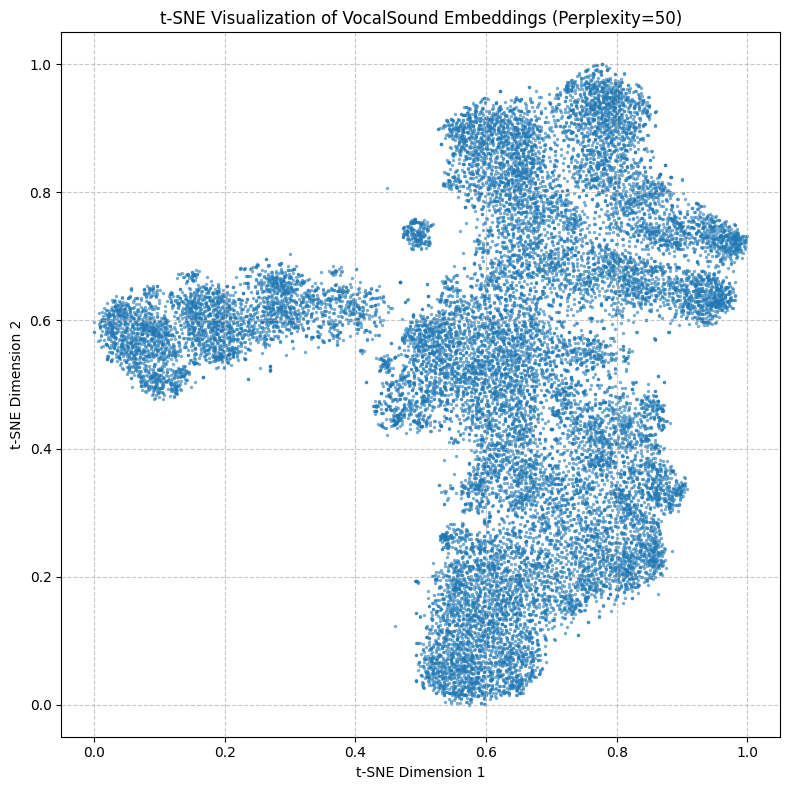

In [16]:
# @title The first scatterplot initialization for t-SNE

import matplotlib.pyplot as plt
import seaborn as sns
import os

PLOT_FILE = 'tsne_visualization.png'
PERPLEXITY = 50

plt.figure(figsize=(8, 8))

sns.scatterplot(
    x='tsne_x',
    y='tsne_y',
    data=final_df,
    s=6,
    alpha=0.6,
    linewidth=0,
    palette='deep'
)

plt.title(f"t-SNE Visualization of VocalSound Embeddings (Perplexity={PERPLEXITY})", fontsize=12)
plt.xlabel("t-SNE Dimension 1", fontsize=10)
plt.ylabel("t-SNE Dimension 2", fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()

plt.savefig(os.path.join("plots", "initial", PLOT_FILE), dpi=300)
print(f"Plot saved to: {PLOT_FILE}")
plt.show()

Plot saved to: tsne_visualization_sound_type.png


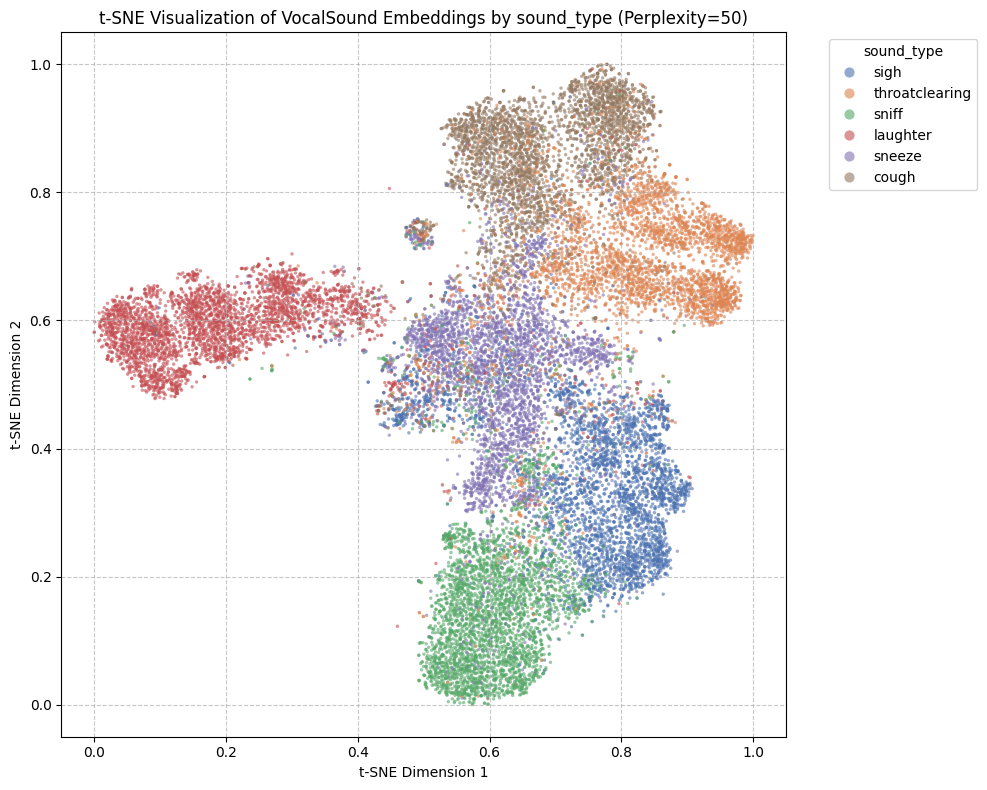

Plot saved to: tsne_visualization_gender.png


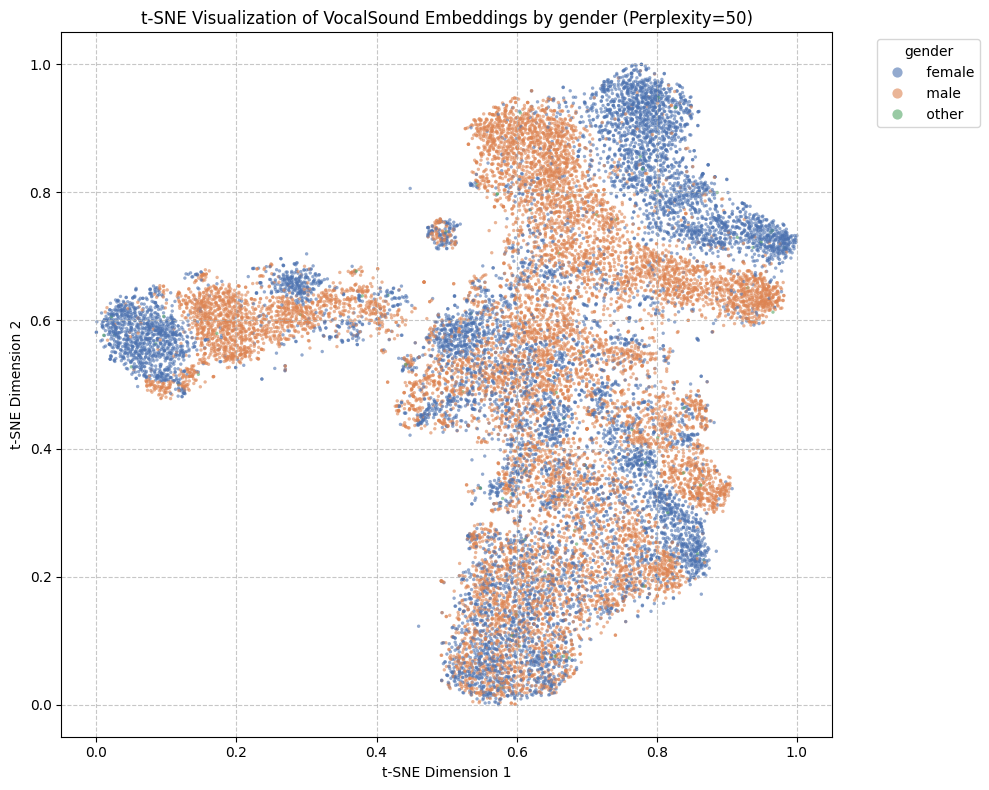

Plot saved to: tsne_visualization_age.png


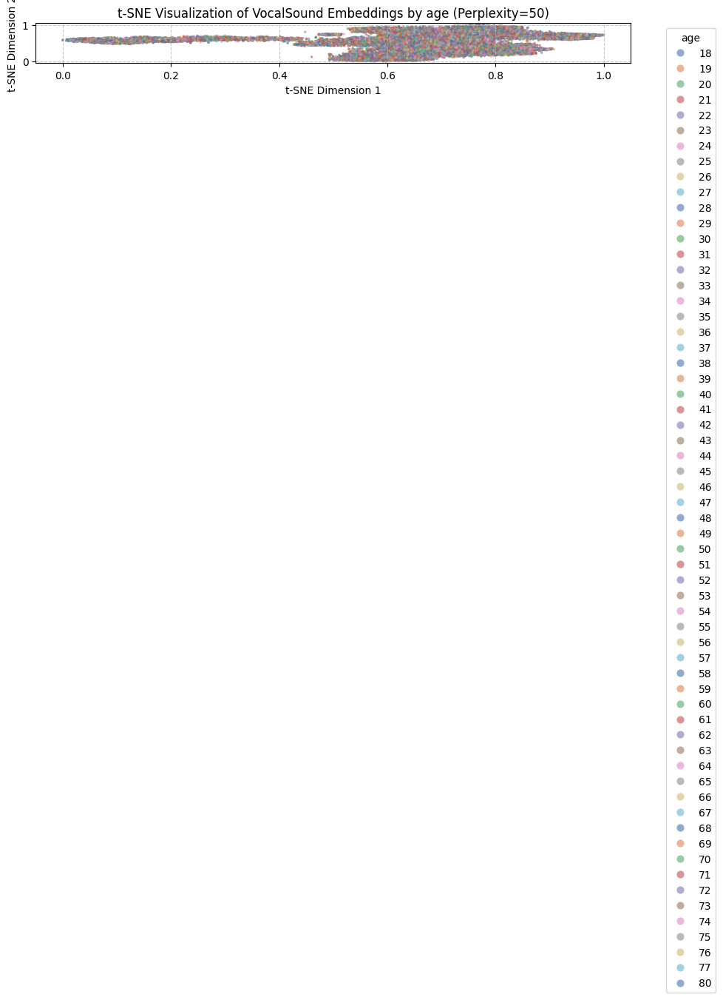

Plot saved to: tsne_visualization_country.png


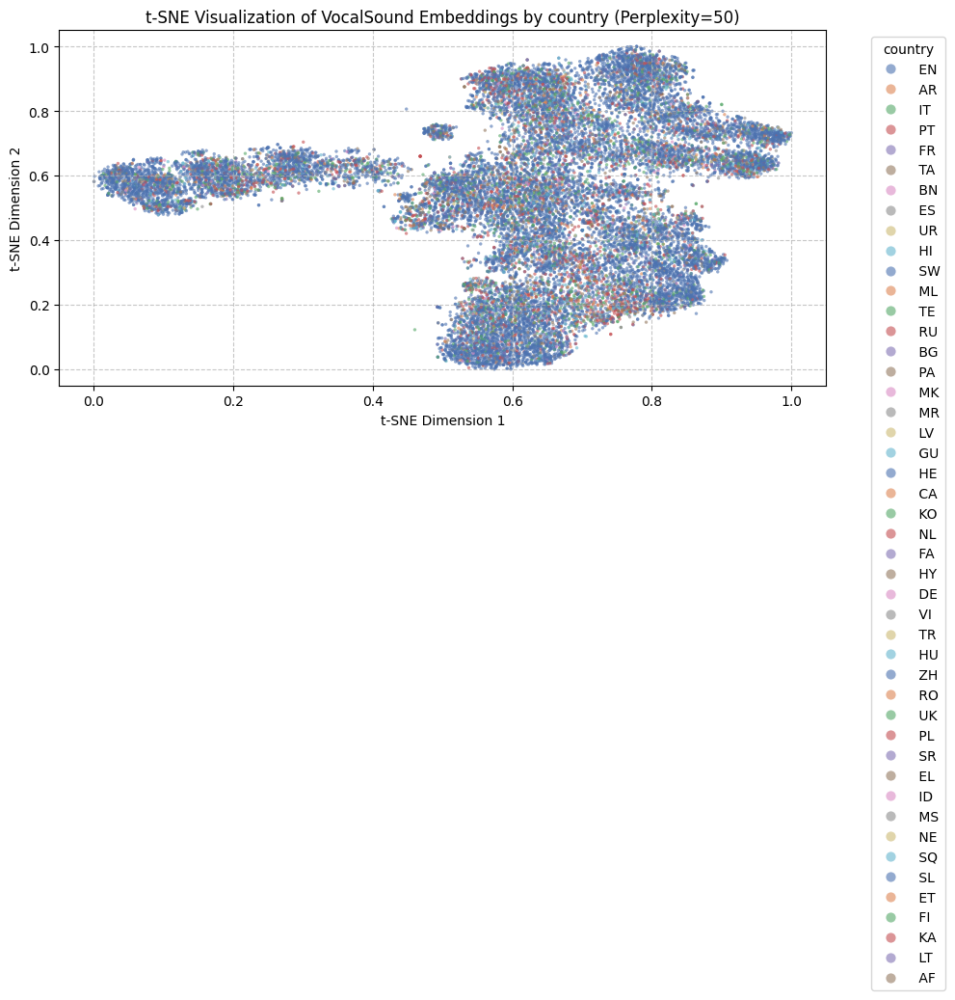

Plot saved to: tsne_visualization_native_language.png


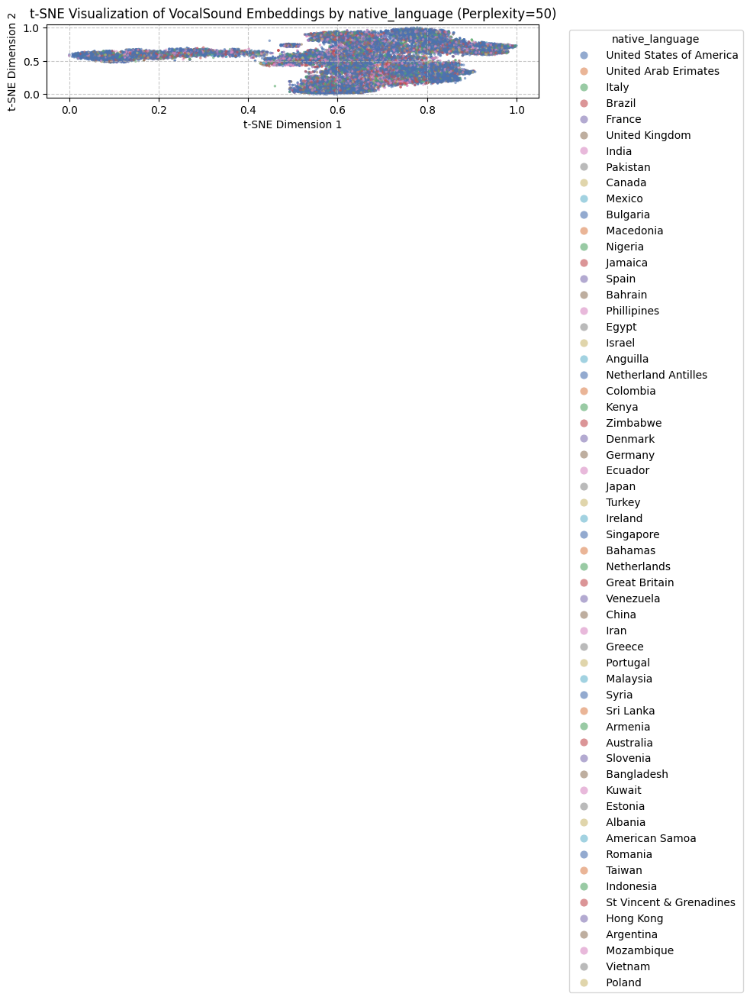

Plot saved to: tsne_visualization_health.png


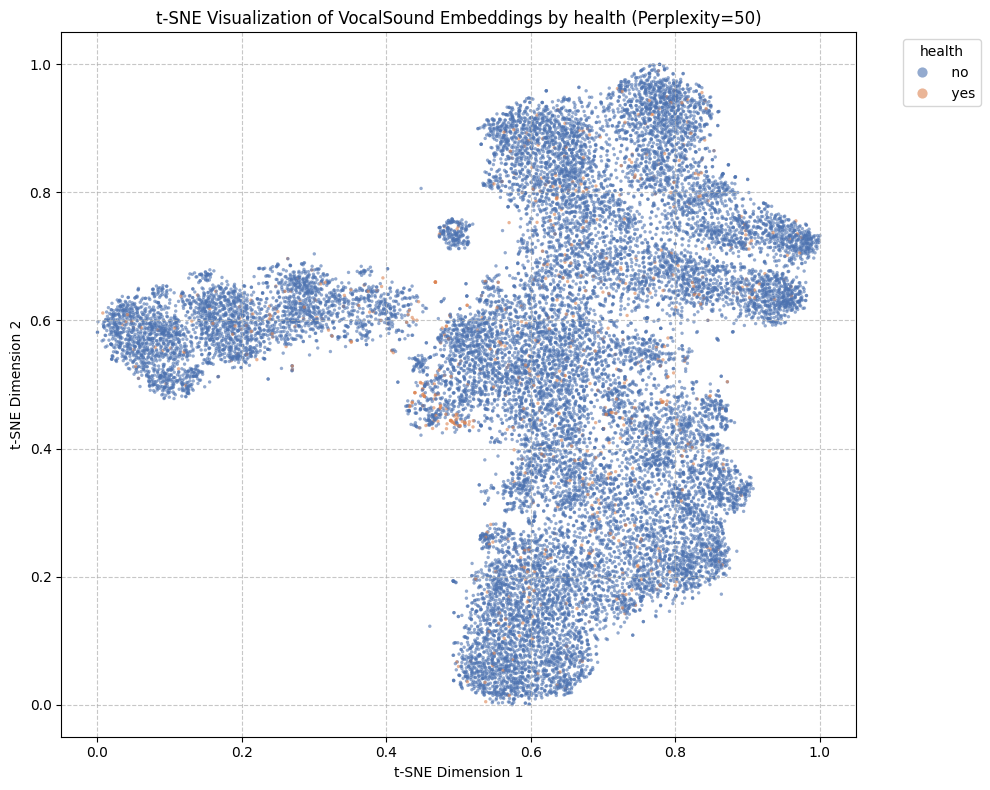

In [17]:
# @title Highlight the different attributes in the scatterplot
filters = ['sound_type', 'gender', 'age', 'country', 'native_language', 'health']

for filter in filters:

    PLOT_FILE = f'tsne_visualization_{filter}.png'

    plt.figure(figsize=(10, 8))

    sns.scatterplot(
        x='tsne_x',
        y='tsne_y',
        hue=filter,
        data=final_df,
        s=6,
        alpha=0.6,
        linewidth=0,
        palette='deep'
    )

    plt.title(f"t-SNE Visualization of VocalSound Embeddings by {filter} (Perplexity={PERPLEXITY})", fontsize=12)
    plt.xlabel("t-SNE Dimension 1", fontsize=10)
    plt.ylabel("t-SNE Dimension 2", fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(title=filter, bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=3.0)
    plt.tight_layout()

    plt.savefig(os.path.join("plots", "initial", PLOT_FILE), dpi=300)
    print(f"Plot saved to: {PLOT_FILE}")
    plt.show()

#### Hyperparameter Search

Now, we go through a range of different perplexity values. We'll save plots, and then manually inspect them observe which perplexity value most clustered similar attributes correctly.

Recall that perplexity is loosely interpreted as the number of nearest neighbors of a point. Since N ~ 20,000, we expect there to
be a relatively high level of neighbors, so that our perplexity range will be skewed large.

In [20]:
# @title Hyperparameter search on perplexity value for t-SNE algorithm
perplexities = [15, 30, 50, 100, 200, 400]
N_ITER = 3000
RANDOM_STATE = 42 # So that re-running yields same plot

for p in perplexities:
  TSNE_FILE = os.path.join('t-SNE', f'vocalsound_tsne_{p}.csv')

  print(f"\nTSNE Parameters: Perplexity={p}")
  start_time = time.time()

  tsne = TSNE(
      n_components=2,
      perplexity=p,
      max_iter=N_ITER,
      random_state=RANDOM_STATE,
      metric='cosine',
      verbose=1,
      init='pca'
  )

  tsne_coordinates = tsne.fit_transform(embeddings)

  # Normalize -- not necessary, but makes it easier to visualize results
  tsne_coordinates -= tsne_coordinates.min(axis=0)
  tsne_coordinates /= tsne_coordinates.max(axis=0)

  end_time = time.time()
  print(f"t-SNE calculation finished in: {end_time - start_time:.2f} seconds.")

  # Add the 2D t-SNE coordinates (x, y) to the DataFrame
  metadata_df['tsne_x'] = tsne_coordinates[:, 0]
  metadata_df['tsne_y'] = tsne_coordinates[:, 1]

  final_columns = [
      'tsne_x',
      'tsne_y',
      'file_name',
      'sound_type',
      'id',
      'gender',
      'age',
      'native_language',
      'country',
      'health'
  ]

  final_df = metadata_df[[col for col in final_columns]]

  final_df.to_csv(TSNE_FILE, index=False)
  print(f"Successfully saved t-SNE data to: {TSNE_FILE}")




TSNE Parameters: Perplexity=15
[t-SNE] Computing 46 nearest neighbors...
[t-SNE] Indexed 20237 samples in 0.004s...
[t-SNE] Computed neighbors for 20237 samples in 5.364s...
[t-SNE] Computed conditional probabilities for sample 1000 / 20237
[t-SNE] Computed conditional probabilities for sample 2000 / 20237
[t-SNE] Computed conditional probabilities for sample 3000 / 20237
[t-SNE] Computed conditional probabilities for sample 4000 / 20237
[t-SNE] Computed conditional probabilities for sample 5000 / 20237
[t-SNE] Computed conditional probabilities for sample 6000 / 20237
[t-SNE] Computed conditional probabilities for sample 7000 / 20237
[t-SNE] Computed conditional probabilities for sample 8000 / 20237
[t-SNE] Computed conditional probabilities for sample 9000 / 20237
[t-SNE] Computed conditional probabilities for sample 10000 / 20237
[t-SNE] Computed conditional probabilities for sample 11000 / 20237
[t-SNE] Computed conditional probabilities for sample 12000 / 20237
[t-SNE] Computed c

Loaded final data from: t-SNE/vocalsound_tsne_15.csv


/var/folders/pn/7ysbjdfn4h3ddgnl7ymjpf5r0000gn/T/ipykernel_34613/3007023142.py:25: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


Plot saved to: tsne_visualization_15.png


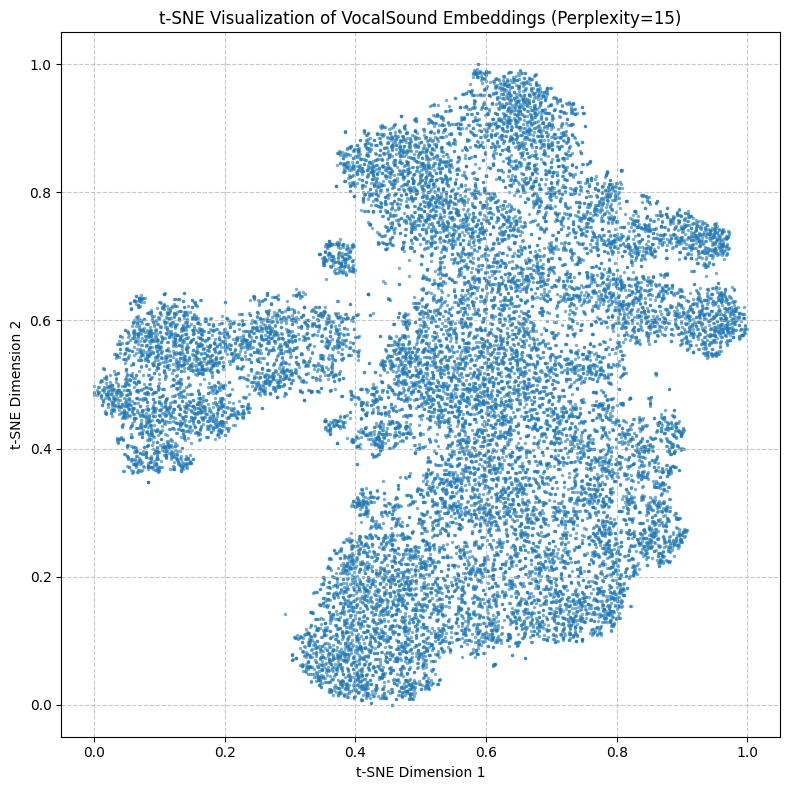

Loaded final data from: t-SNE/vocalsound_tsne_30.csv


/var/folders/pn/7ysbjdfn4h3ddgnl7ymjpf5r0000gn/T/ipykernel_34613/3007023142.py:25: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


Plot saved to: tsne_visualization_30.png


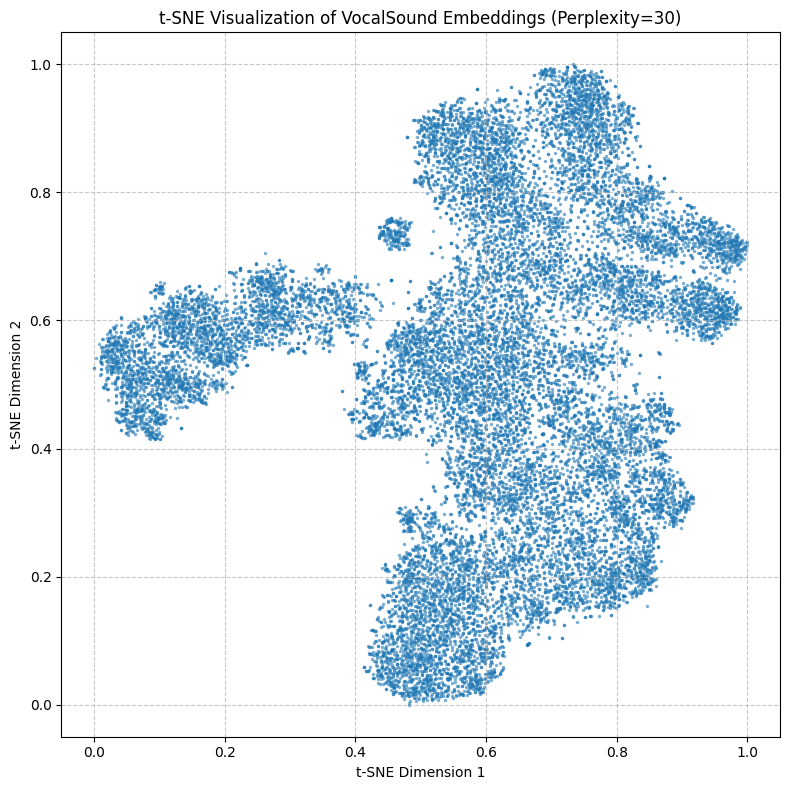

Loaded final data from: t-SNE/vocalsound_tsne_50.csv


/var/folders/pn/7ysbjdfn4h3ddgnl7ymjpf5r0000gn/T/ipykernel_34613/3007023142.py:25: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


Plot saved to: tsne_visualization_50.png


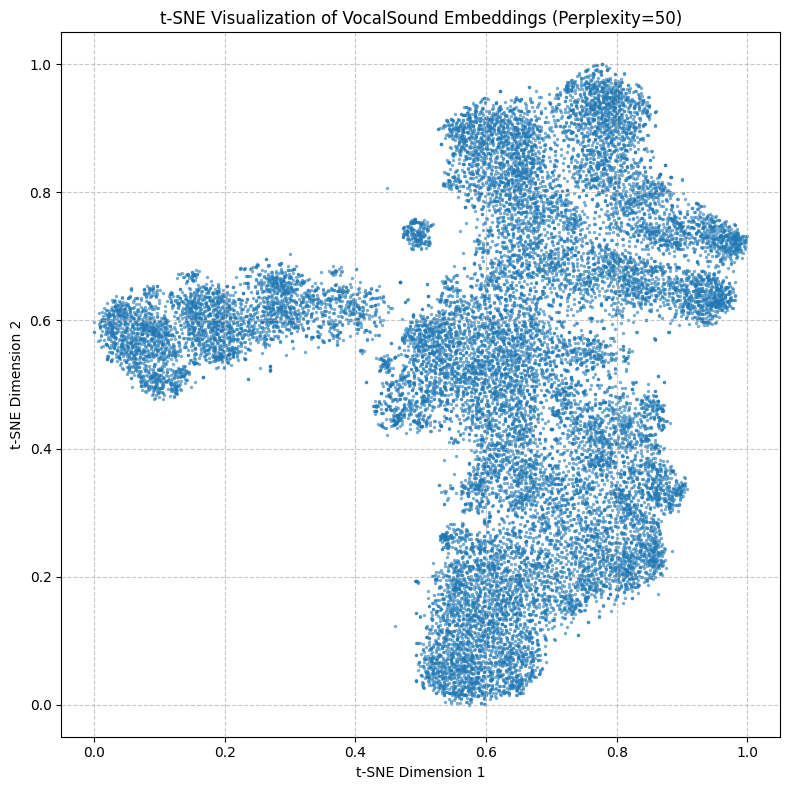

Loaded final data from: t-SNE/vocalsound_tsne_100.csv


/var/folders/pn/7ysbjdfn4h3ddgnl7ymjpf5r0000gn/T/ipykernel_34613/3007023142.py:25: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


Plot saved to: tsne_visualization_100.png


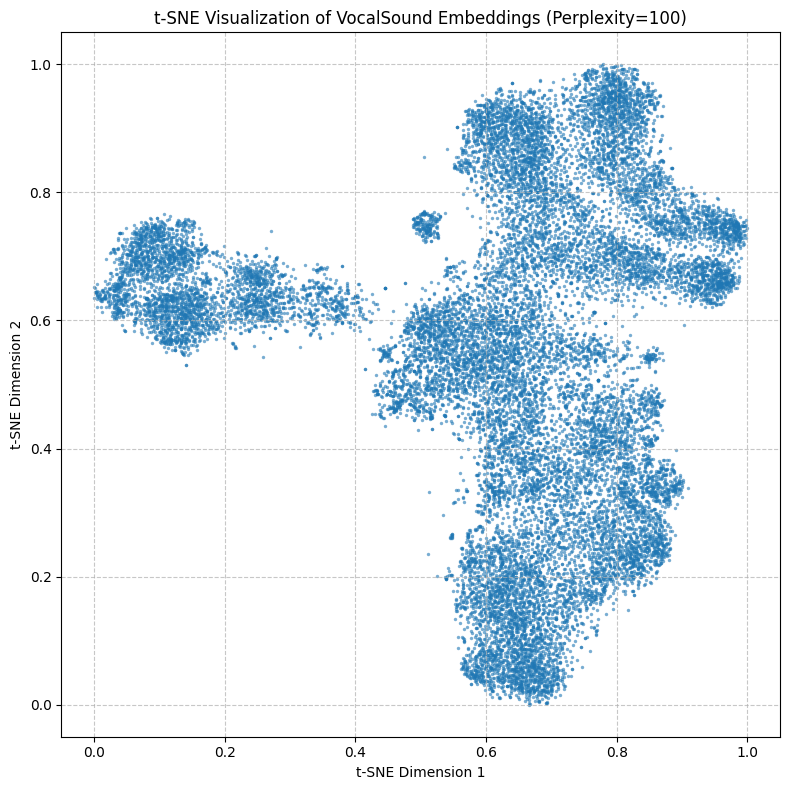

Loaded final data from: t-SNE/vocalsound_tsne_200.csv


/var/folders/pn/7ysbjdfn4h3ddgnl7ymjpf5r0000gn/T/ipykernel_34613/3007023142.py:25: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


Plot saved to: tsne_visualization_200.png


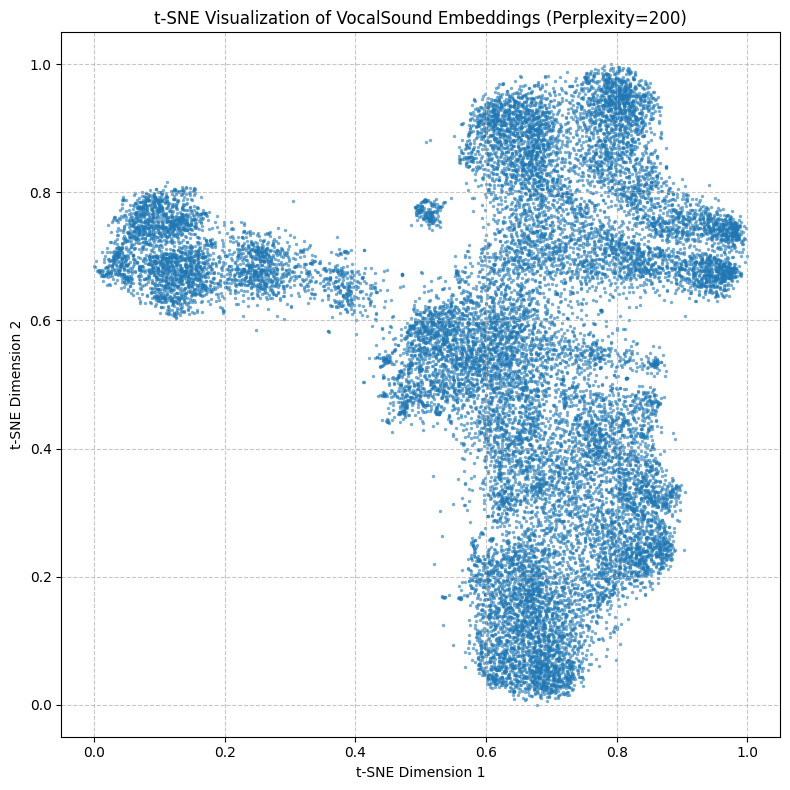

Loaded final data from: t-SNE/vocalsound_tsne_400.csv


/var/folders/pn/7ysbjdfn4h3ddgnl7ymjpf5r0000gn/T/ipykernel_34613/3007023142.py:25: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


Plot saved to: tsne_visualization_400.png


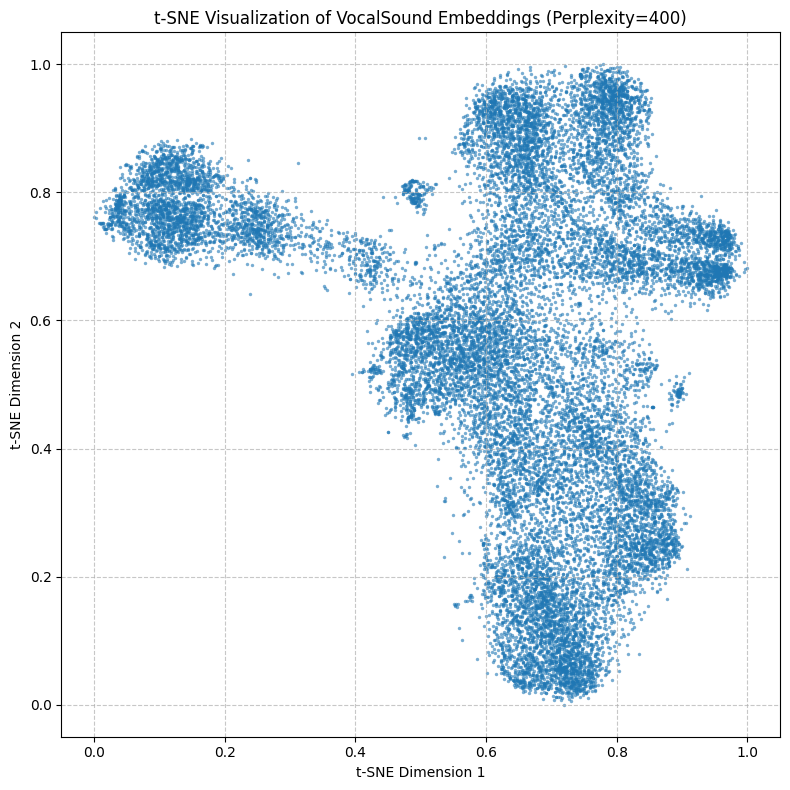

In [21]:
# @title Load and plot t-SNE visualizations for each perplexity

import matplotlib.pyplot as plt
import seaborn as sns
import os

BASE_PLOTS_DIR = 'plots'
os.makedirs(BASE_PLOTS_DIR, exist_ok=True)

for p in perplexities:
    TSNE_FILE = os.path.join('t-SNE', f'vocalsound_tsne_{p}.csv')

    try:
        final_df = pd.read_csv(TSNE_FILE)
        print(f"Loaded final data from: {TSNE_FILE}")
    except FileNotFoundError:
        print(f"Error: The file '{TSNE_FILE}' was not found.")

    OUTPUT_SUBDIR = os.path.join(BASE_PLOTS_DIR, f'perplexity-{p}')
    os.makedirs(OUTPUT_SUBDIR, exist_ok=True)
    PLOT_FILE = f'tsne_visualization_{p}.png'

    plt.figure(figsize=(8, 8))

    sns.scatterplot(
        x='tsne_x',
        y='tsne_y',
        data=final_df,
        s=6,
        alpha=0.6,
        linewidth=0,
        palette='deep'
    )

    plt.title(f"t-SNE Visualization of VocalSound Embeddings (Perplexity={p})", fontsize=12)
    plt.xlabel("t-SNE Dimension 1", fontsize=10)
    plt.ylabel("t-SNE Dimension 2", fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()

    full_plot_path = os.path.join(OUTPUT_SUBDIR, PLOT_FILE)
    plt.savefig(full_plot_path, dpi=300)
    print(f"Plot saved to: {PLOT_FILE}")
    plt.show()

#### Visualizations

We wish to see how well this t-SNE performs. Let's plot the points based on their attributes, and see
if they cluster well

Loaded final data from: t-SNE/vocalsound_tsne_15.csv
Plot saved to: tsne_visualization_15_sound_type.png


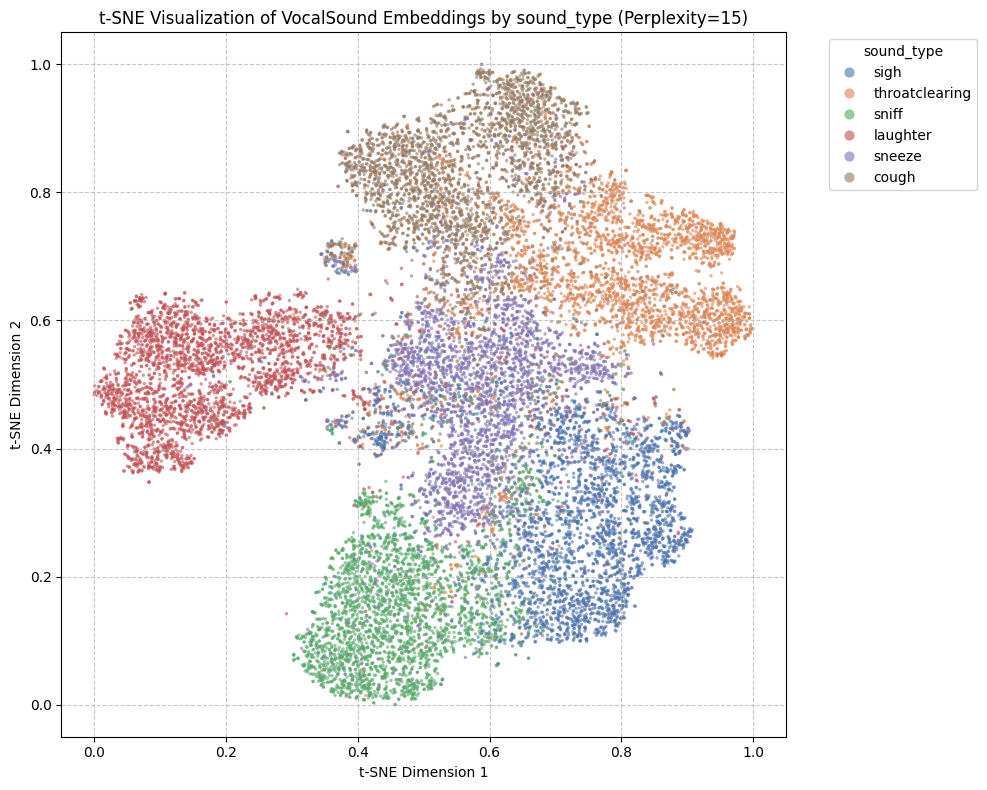

Loaded final data from: t-SNE/vocalsound_tsne_15.csv
Plot saved to: tsne_visualization_15_gender.png


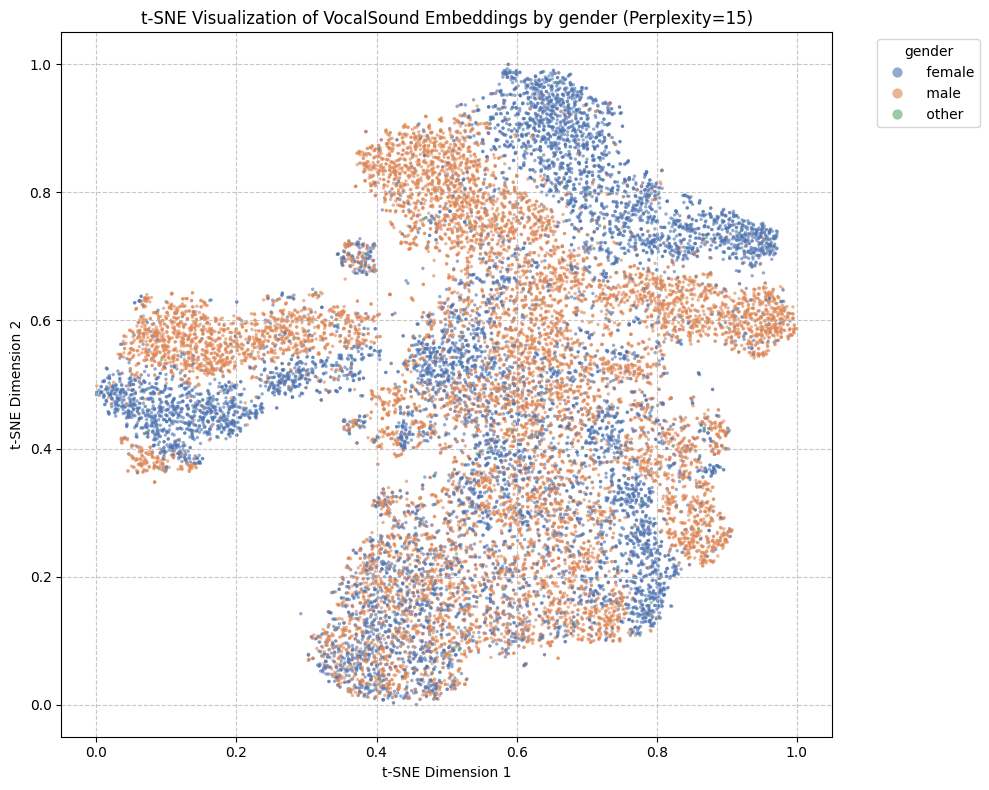

Loaded final data from: t-SNE/vocalsound_tsne_30.csv
Plot saved to: tsne_visualization_30_sound_type.png


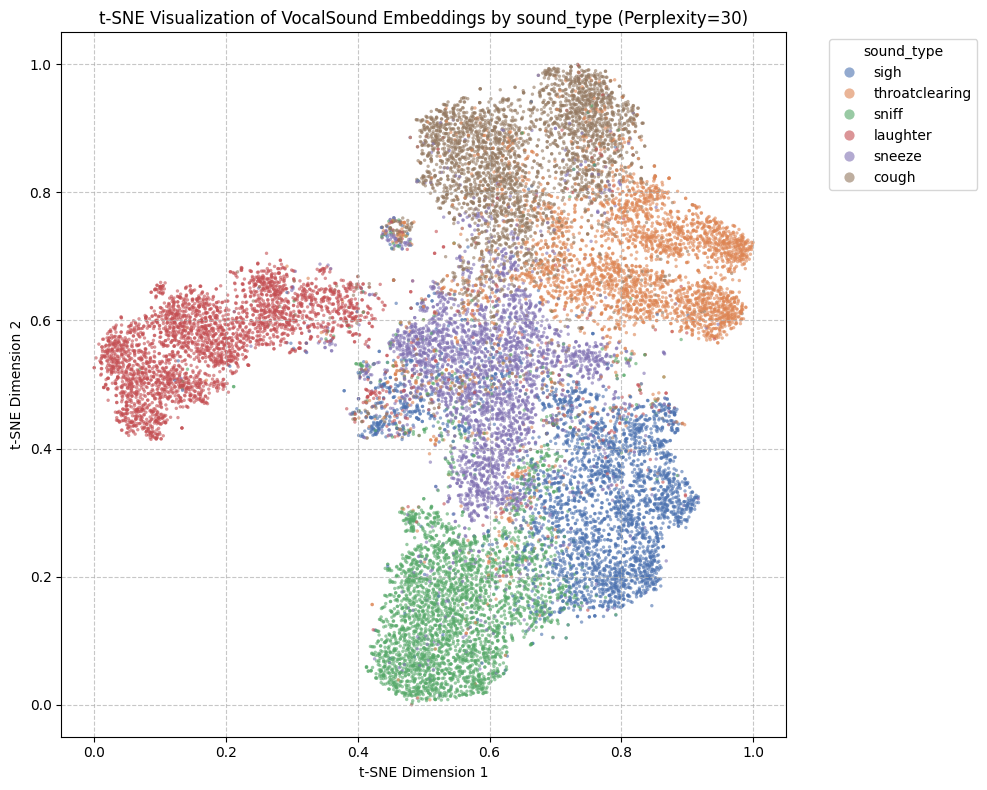

Loaded final data from: t-SNE/vocalsound_tsne_30.csv
Plot saved to: tsne_visualization_30_gender.png


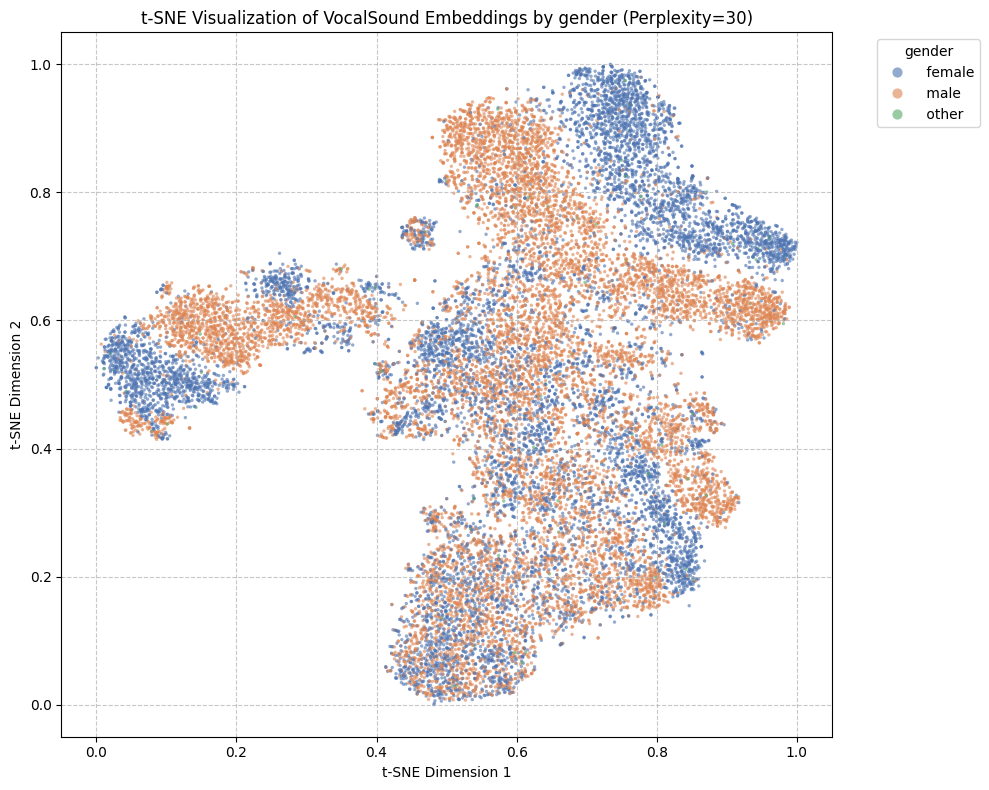

Loaded final data from: t-SNE/vocalsound_tsne_50.csv
Plot saved to: tsne_visualization_50_sound_type.png


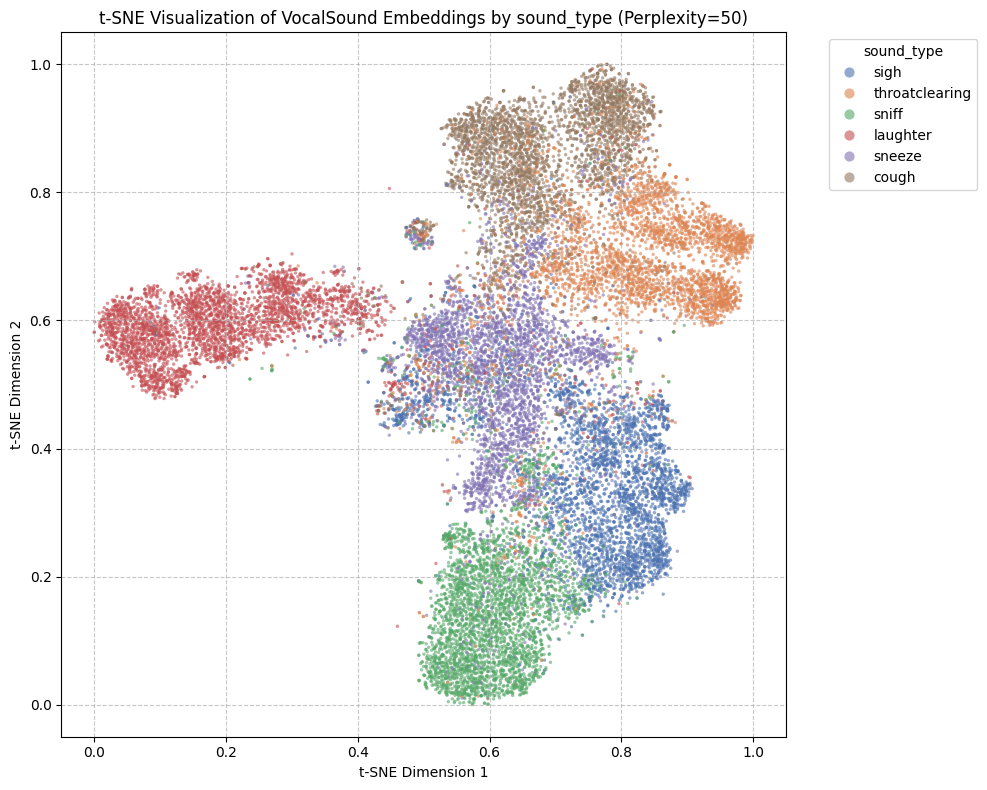

Loaded final data from: t-SNE/vocalsound_tsne_50.csv
Plot saved to: tsne_visualization_50_gender.png


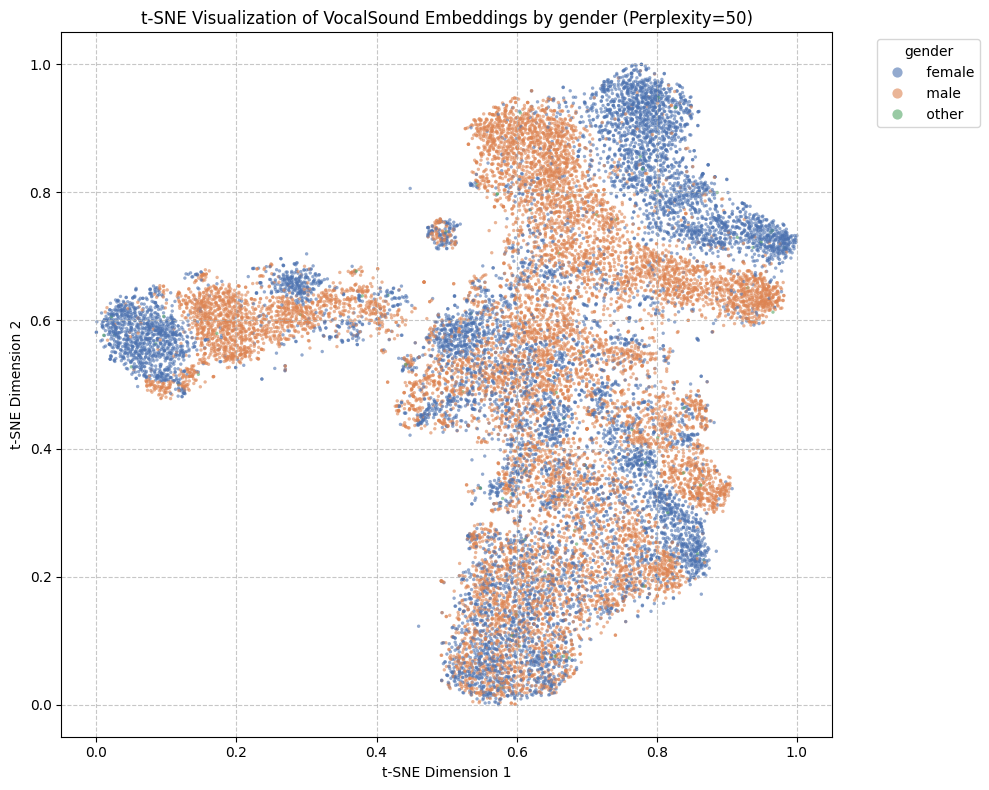

Loaded final data from: t-SNE/vocalsound_tsne_100.csv
Plot saved to: tsne_visualization_100_sound_type.png


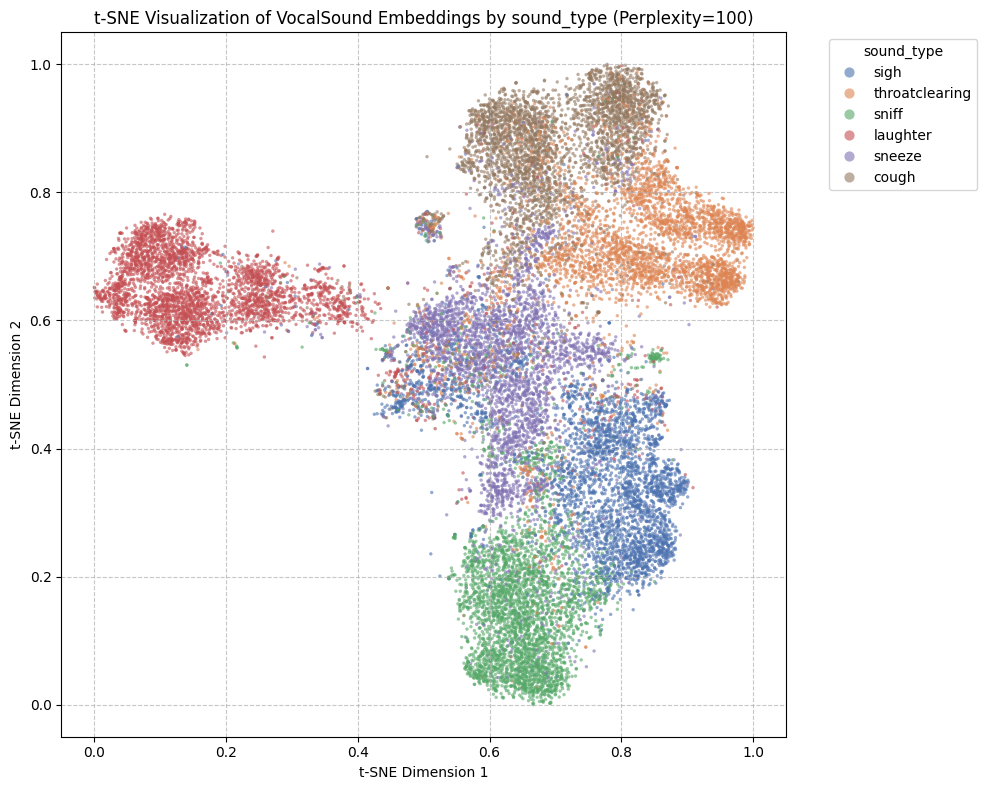

Loaded final data from: t-SNE/vocalsound_tsne_100.csv
Plot saved to: tsne_visualization_100_gender.png


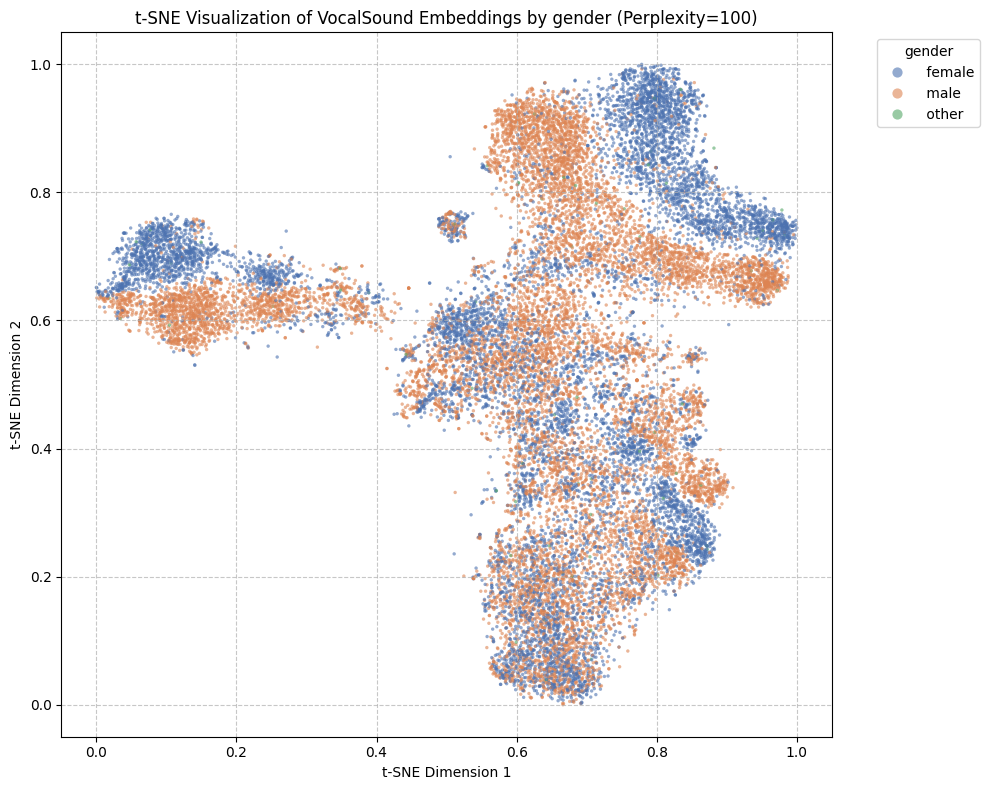

Loaded final data from: t-SNE/vocalsound_tsne_200.csv
Plot saved to: tsne_visualization_200_sound_type.png


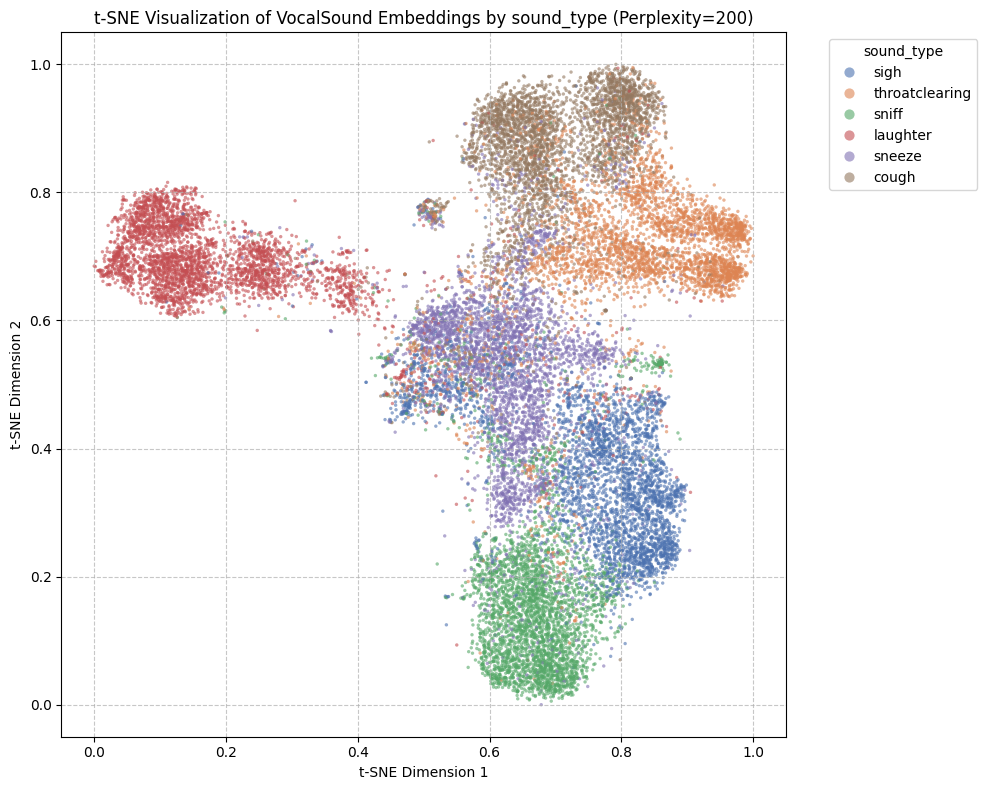

Loaded final data from: t-SNE/vocalsound_tsne_200.csv
Plot saved to: tsne_visualization_200_gender.png


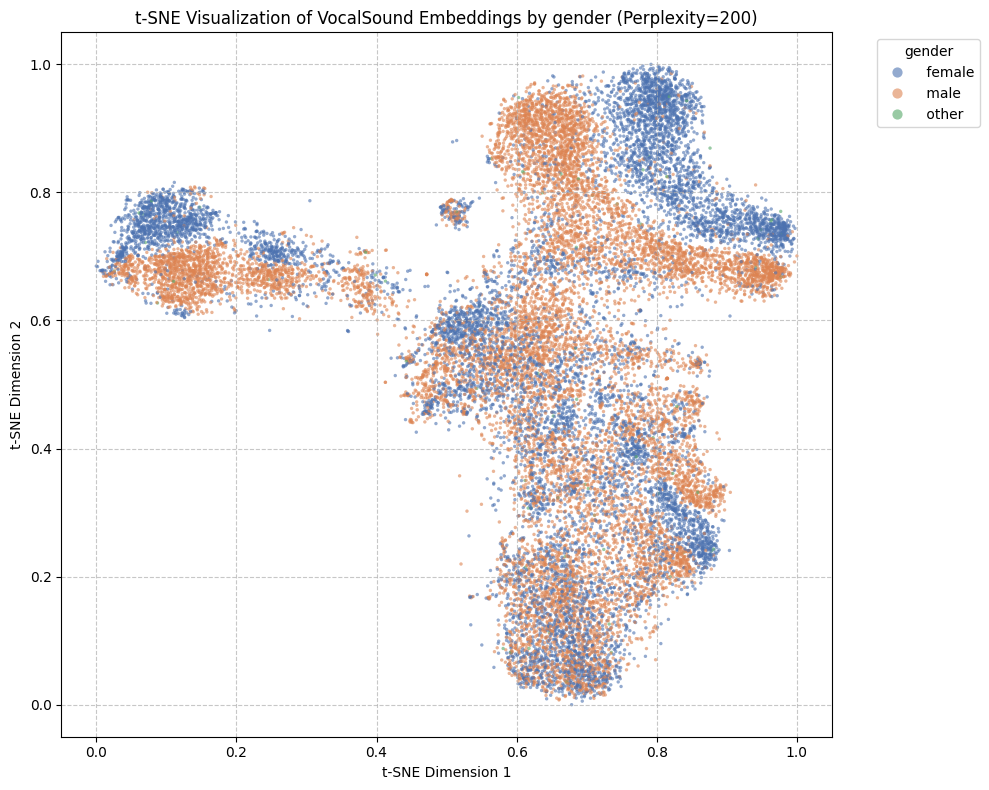

Loaded final data from: t-SNE/vocalsound_tsne_400.csv
Plot saved to: tsne_visualization_400_sound_type.png


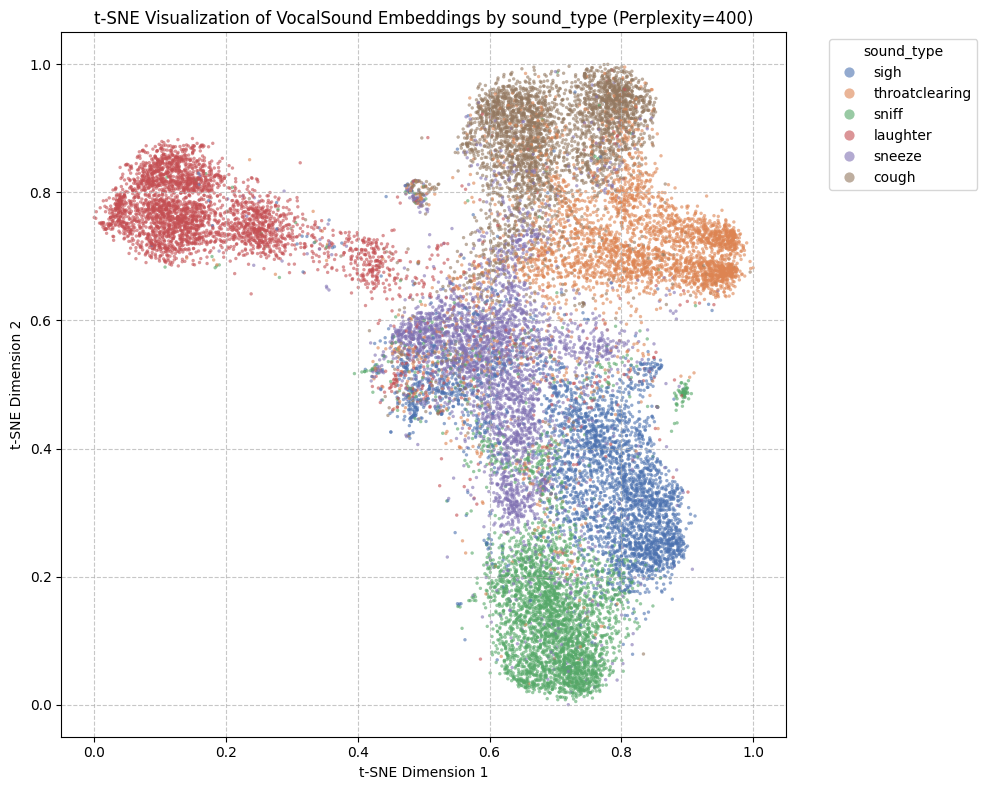

Loaded final data from: t-SNE/vocalsound_tsne_400.csv
Plot saved to: tsne_visualization_400_gender.png


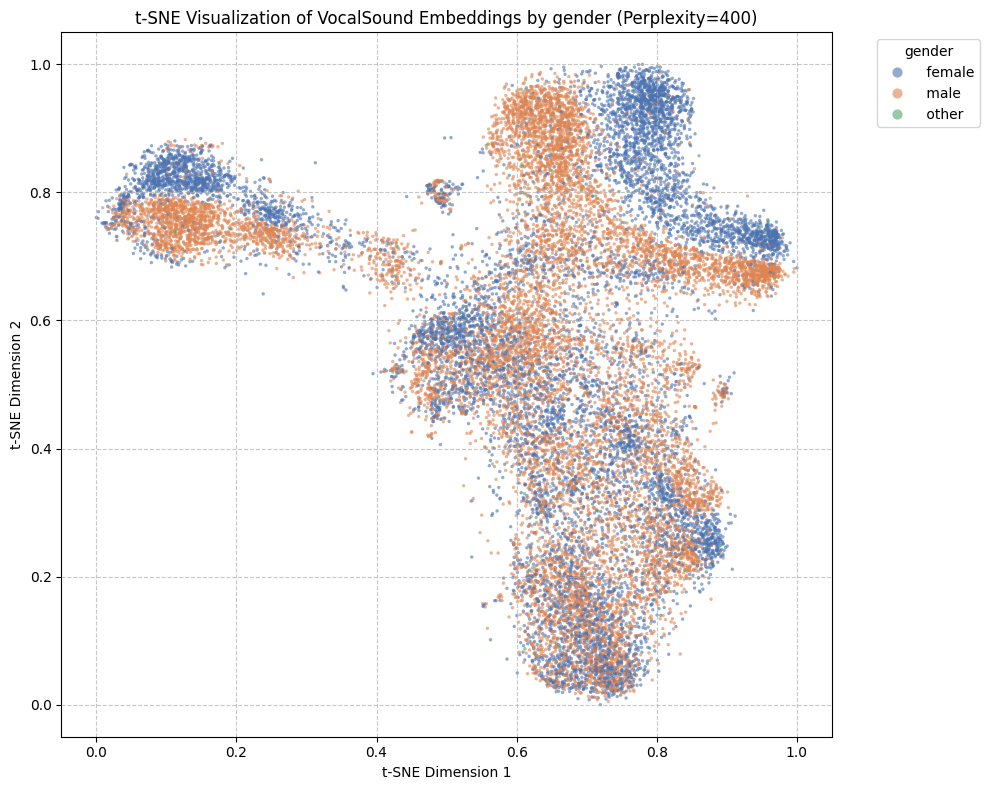

In [23]:
# @title Load and plot t-SNE visualizations for different attributes for each perplexity

BASE_PLOTS_DIR = 'plots'
os.makedirs(BASE_PLOTS_DIR, exist_ok=True)

filters = ['sound_type', 'gender']

for p in perplexities:
  for filter in filters:

      TSNE_FILE = os.path.join('t-SNE', f'vocalsound_tsne_{p}.csv')

      try:
        final_df = pd.read_csv(TSNE_FILE)
        print(f"Loaded final data from: {TSNE_FILE}")
      except FileNotFoundError:
        print(f"Error: The file '{TSNE_FILE}' was not found.")

      PLOT_FILE = f'tsne_visualization_{p}_{filter}.png'

      plt.figure(figsize=(10, 8))

      sns.scatterplot(
          x='tsne_x',
          y='tsne_y',
          hue=filter,
          data=final_df,
          s=6,
          alpha=0.6,
          linewidth=0,
          palette='deep'
      )

      plt.title(f"t-SNE Visualization of VocalSound Embeddings by {filter} (Perplexity={p})", fontsize=12)
      plt.xlabel("t-SNE Dimension 1", fontsize=10)
      plt.ylabel("t-SNE Dimension 2", fontsize=10)
      plt.grid(True, linestyle='--', alpha=0.7)
      plt.legend(title=filter, bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=3.0)
      plt.tight_layout()

      plt.savefig(os.path.join('plots', f'perplexity-{p}', PLOT_FILE), dpi=300)
      print(f"Plot saved to: {PLOT_FILE}")
      plt.show()

### Convert the t-SNE embeddings into 2D grid

We use the logic found in https://github.com/kylemcdonald/CloudToGrid

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import time
import math
from sklearn.manifold import TSNE
from scipy.spatial.distance import cdist
# Note: Assuming you have 'lapjv' available from the 'lap' library or similar
# For simplicity and robust code, we will use the standard 'scipy.optimize.linear_sum_assignment'
from scipy.optimize import linear_sum_assignment as lap_solver
import lap

In [33]:
# Regenerate the t-SNE
PERPLEXITY = 50
N_ITER = 3000
RANDOM_STATE = 42

print(f"\nTSNE Parameters: Perplexity={PERPLEXITY}, Iterations={N_ITER}")
print("Starting t-SNE calculation...")
start_time = time.time()

tsne = TSNE(
    n_components=2,
    perplexity=PERPLEXITY,
    max_iter=N_ITER,
    random_state=RANDOM_STATE,
    metric='cosine', # Cosine distance is often better for embeddings than Euclidean
    verbose=1,
    init='pca'
)

tsne_coordinates = tsne.fit_transform(embeddings)

# Normalize -- not necessary, but makes it easier to visualize results
tsne_coordinates -= tsne_coordinates.min(axis=0)
tsne_coordinates /= tsne_coordinates.max(axis=0)

data2d = tsne_coordinates

end_time = time.time()

print(f"t-SNE calculation finished in: {end_time - start_time:.2f} seconds.")


TSNE Parameters: Perplexity=50, Iterations=3000
Starting t-SNE calculation...
[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 20237 samples in 0.003s...
[t-SNE] Computed neighbors for 20237 samples in 5.964s...
[t-SNE] Computed conditional probabilities for sample 1000 / 20237
[t-SNE] Computed conditional probabilities for sample 2000 / 20237
[t-SNE] Computed conditional probabilities for sample 3000 / 20237
[t-SNE] Computed conditional probabilities for sample 4000 / 20237
[t-SNE] Computed conditional probabilities for sample 5000 / 20237
[t-SNE] Computed conditional probabilities for sample 6000 / 20237
[t-SNE] Computed conditional probabilities for sample 7000 / 20237
[t-SNE] Computed conditional probabilities for sample 8000 / 20237
[t-SNE] Computed conditional probabilities for sample 9000 / 20237
[t-SNE] Computed conditional probabilities for sample 10000 / 20237
[t-SNE] Computed conditional probabilities for sample 11000 / 20237
[t-SNE] Computed conditional probabili

t-SNE shape: (20237, 2)
Grid shape: (20449, 2)


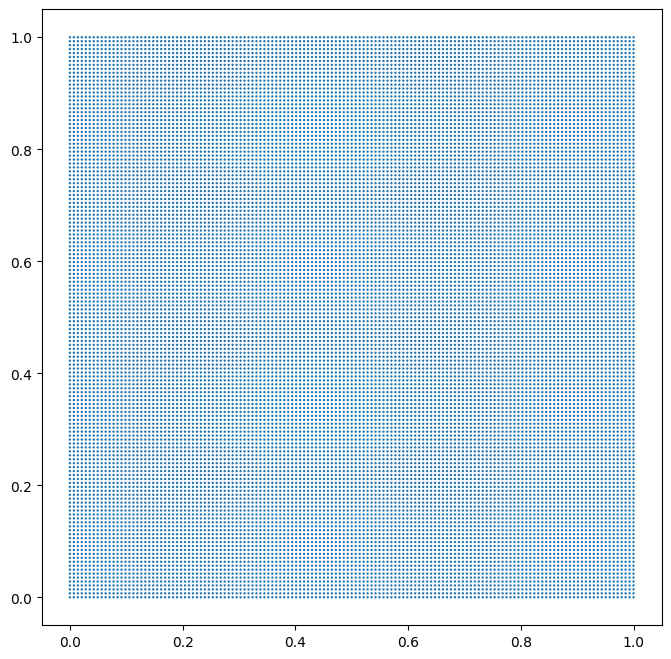

In [34]:
# @title Grid creation
num_data = len(data2d)
side = math.ceil(np.sqrt(num_data))

xv, yv = np.meshgrid(np.linspace(0, 1, side), np.linspace(0, 1, side))
grid = np.dstack((xv, yv)).reshape(-1, 2)

print(f"t-SNE shape: {data2d.shape}")
print(f"Grid shape: {grid.shape}")

plt.figure(figsize=(8,8))
plt.scatter(grid[:,0], grid[:,1], edgecolors='none', marker='o', s=3)
plt.show()

# Add the t-SNE coordinates to metadata_df for later use (if not already there)
metadata_df['tsne_x'] = data2d[:, 0]
metadata_df['tsne_y'] = data2d[:, 1]
final_df = metadata_df.copy()


In [35]:
# 1. Calculate the Cost Matrix (Squared Euclidean Distance)
print("\nCalculating Cost Matrix...")
# Cost is the distance from every grid point to every t-SNE point
# grid (M, 2) vs data2d (N, 2) -> cost matrix (M, N)
# Note: The assignment problem requires the cost matrix be square or solved on a padded one.
# It is often solved as cost[i, j] = dist from point_i to grid_j.
# Let's use cost[i, j] = dist from data2d[i] to grid[j], so cost shape is (N, M).
cost = cdist(data2d, grid, 'sqeuclidean')

# 2. Solve the Linear Assignment Problem (using scipy.optimize.linear_sum_assignment)
# cost matrix must be (N, M), where N <= M
print("Solving Linear Assignment Problem (LAP)...")
start_time = time.time()
# The solver finds the assignment that minimizes the total cost.
# row_assigns: indices of rows (t-SNE data points)
# col_assigns: indices of columns (Grid points)
# NOTE: There are other ways of doing this (LOOK at the notebook)
row_assigns, col_assigns = lap_solver(cost)
end_time = time.time()
print(f"LAP solved in: {end_time - start_time:.2f} seconds.")

# 3. Create the new DataFrame with the mapped grid coordinates
# The new coordinates for the t-SNE data points are the selected grid points.
# col_assigns tells us which grid index (column) was assigned to which data index (row).
grid_mapped_coords = grid[col_assigns]

# 4. Add the Grid Coordinates to the Final DataFrame
# Note: row_assigns gives the indices of the rows in the cost matrix that were assigned.
# Since we used the whole data2d as the first argument, row_assigns should be [0, 1, 2, ..., N-1].
# We map the assigned grid coordinates directly back to the original final_df.
final_df['grid_x'] = np.nan
final_df['grid_y'] = np.nan
final_df.loc[row_assigns, ['grid_x', 'grid_y']] = grid_mapped_coords

print("New columns 'grid_x' and 'grid_y' added to final_df.")


Calculating Cost Matrix...
Solving Linear Assignment Problem (LAP)...
LAP solved in: 1673.24 seconds.
New columns 'grid_x' and 'grid_y' added to final_df.


Plot saved to: grid_visualization_sound_type.png


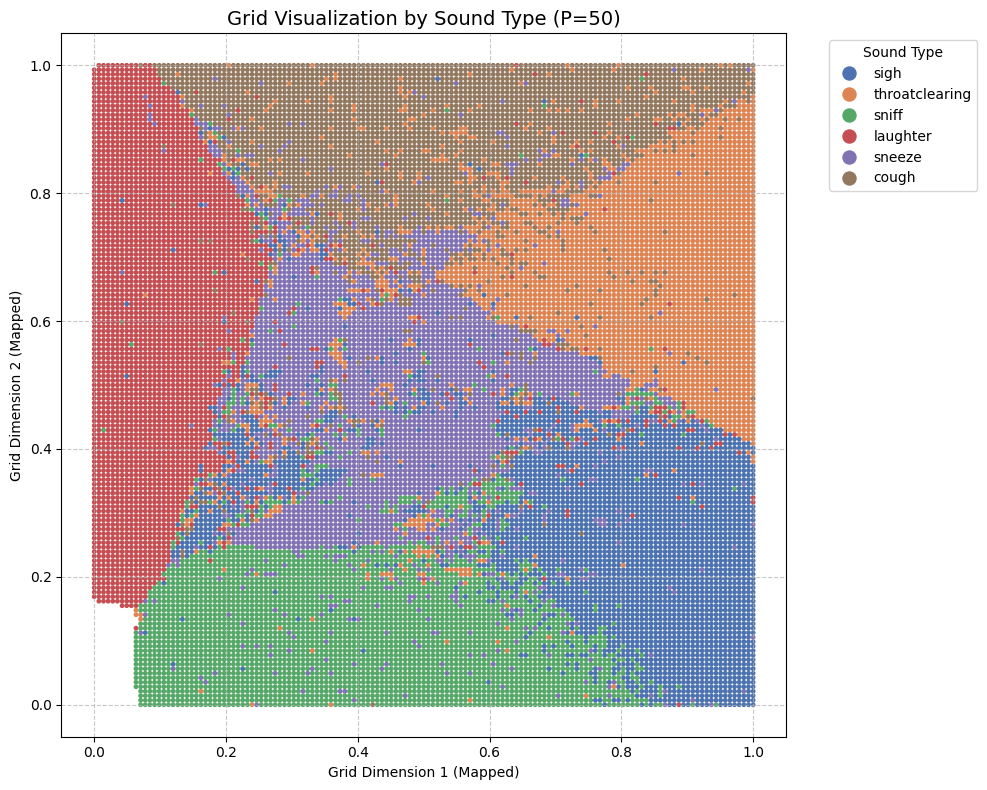

Plot saved to: grid_visualization_gender.png


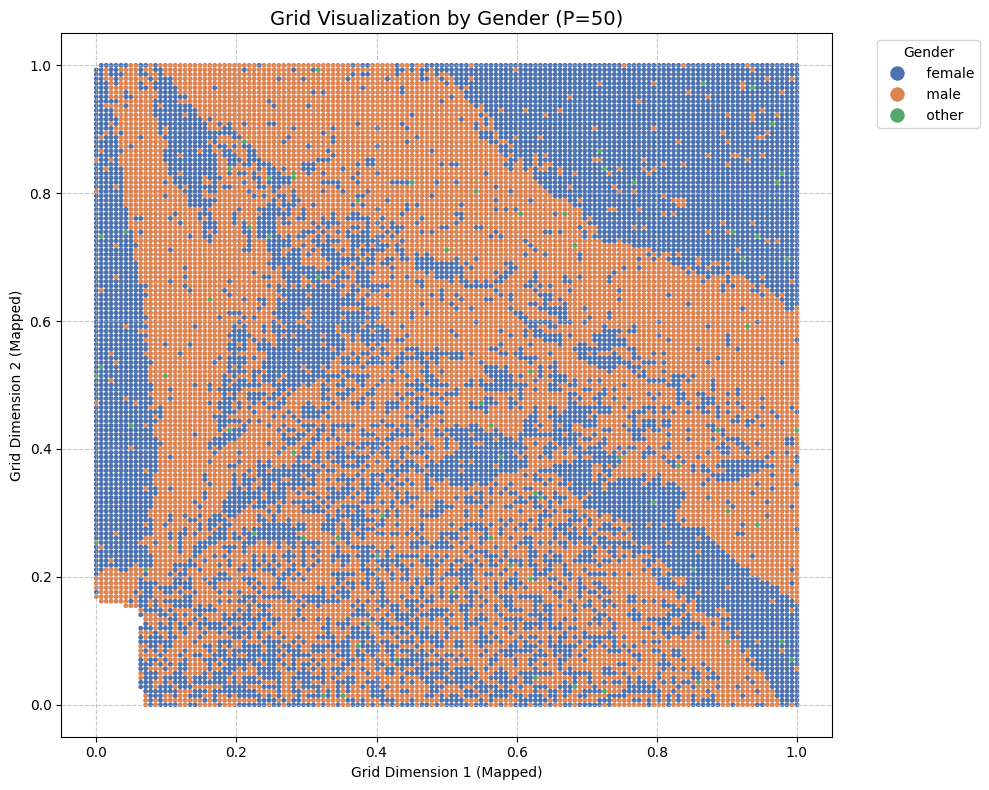

In [36]:
filters = ['sound_type', 'gender']

BASE_PLOTS_DIR = 'plots/grid_visualization'
os.makedirs(BASE_PLOTS_DIR, exist_ok=True)

for filter in filters:

    PLOT_FILE = f'grid_visualization_{filter}.png'
    plot_title_filter = filter.replace('_', ' ').title()

    plt.figure(figsize=(10, 8))

    # Plot the mapped grid coordinates instead of tsne_x/tsne_y
    sns.scatterplot(
        x='grid_x',
        y='grid_y',
        hue=filter,
        data=final_df,
        s=12,           # Use a slightly larger size since points don't overlap as much
        alpha=1.0,      # Full opacity is fine now
        linewidth=0,
        palette='deep'
    )

    plt.title(f"Grid Visualization by {plot_title_filter} (P={PERPLEXITY})", fontsize=14)
    plt.xlabel("Grid Dimension 1 (Mapped)", fontsize=10)
    plt.ylabel("Grid Dimension 2 (Mapped)", fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(title=plot_title_filter, bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=3.0)
    plt.tight_layout()

    plt.savefig(os.path.join(BASE_PLOTS_DIR, PLOT_FILE), dpi=300)
    print(f"Plot saved to: {PLOT_FILE}")
    plt.show()

# You now have the grid_x and grid_y columns in final_df which can be saved for the frontend.

Experiment with different algorithms

TODO: Also look at the Gemini comments to understand what's up with the matrix and how the computation works and all that

In [4]:
# @title Experiment with different algorithms

# --- External solver wrappers (Placeholder for external libraries) ---
# NOTE: Replace these with your actual imports if you are using 'lap' or 'munkres' etc.
# For simplicity, we define placeholders that mimic the expected output (col_assigns)

def lapjv_lap(cost_matrix):
    # This assumes 'lap' is an external library object
    # In a real environment, you'd replace this with: min_cost, row_a, col_a = lap.lapjv(np.copy(cost_matrix))
    # For this example, we'll just fall back to the scipy solver if external is unavailable
    min_cost, row_assigns_padded, col_assigns_padded = lap.lapjv(np.copy(cost_matrix), extend_cost=True)

    # Truncate the results to the number of actual data points (N rows)
    N = cost_matrix.shape[0]

     # The actual assignments for the N data points are in the first N elements of the returned arrays.
    row_assigns = row_assigns_padded[:N]
    col_assigns = col_assigns_padded[:N]

    return col_assigns


# --- CONFIGURATION ---
PERPLEXITY = 50
TSNE_INPUT_FILE = os.path.join('t-SNE', f'vocalsound_tsne_{PERPLEXITY}.csv')
BASE_PLOTS_DIR = os.path.join('plots', 'grid_visualization', 'initial')
os.makedirs(BASE_PLOTS_DIR, exist_ok=True)
FILTERS = ['sound_type', 'gender']
SOLVERS = {
    #'scipy_lap': lap_solver,
    'lapjv_lap': lapjv_lap,
}

# --- 1. LOAD PRE-COMPUTED T-SNE DATA ---
try:
    # Load the file corresponding to the selected perplexity
    final_df = pd.read_csv(TSNE_INPUT_FILE)
    data2d = final_df[['tsne_x', 'tsne_y']].values
    print(f"\nLoaded pre-computed t-SNE data from: {TSNE_INPUT_FILE}")
    print(f"t-SNE data shape: {data2d.shape}")
except FileNotFoundError:
    raise FileNotFoundError(f"Error: The t-SNE file '{TSNE_INPUT_FILE}' was not found. Cannot proceed.")

# --- 2. GRID CREATION ---
num_data = len(data2d)
side = math.ceil(np.sqrt(num_data)) # For 20237, side is 143

xv, yv = np.meshgrid(np.linspace(0, 1, side), np.linspace(0, 1, side))
grid = np.dstack((xv, yv)).reshape(-1, 2)

print(f"Grid created with side: {side}, total grid points: {len(grid)}")

# --- 3. CALCULATE COST MATRIX (ONLY ONCE) ---
print("\nCalculating Cost Matrix (Squared Euclidean Distance)...")
# Cost[i, j] = distance from data2d[i] to grid[j]
# Shape: (N, M) where N=len(data2d), M=len(grid)
cost = cdist(data2d, grid, 'sqeuclidean')

# --- 4. SOLVE LAP WITH MULTIPLE SOLVERS, SAVE, AND PLOT ---
for solver_name, solver_func in SOLVERS.items():
    print(f"\n--- Running LAP with Solver: {solver_name} ---")

    current_df = final_df.copy()

    # Solve the Linear Assignment Problem
    start_time = time.time()

    # row_assigns, col_assigns = solver_func(cost)

    if solver_name == 'scipy_lap':
        # scipy.optimize.linear_sum_assignment returns (row_assigns, col_assigns)
        row_assigns, col_assigns = solver_func(cost)
    else:
        # Assuming external solvers return just col_assigns (the grid index for each data point)
        col_assigns = solver_func(cost)
        # We assume row_assigns is just the original indices
        row_assigns = np.arange(len(data2d))

    end_time = time.time()
    print(f"LAP solved in: {end_time - start_time:.2f} seconds.")

    # Get the mapped coordinates
    grid_mapped_coords = grid[col_assigns]

    # Add the Grid Coordinates to the DataFrame
    current_df['grid_x'] = np.nan
    current_df['grid_y'] = np.nan
    current_df.loc[row_assigns, ['grid_x', 'grid_y']] = grid_mapped_coords

    # --- SAVE THE MAPPED DATA (Request 1) ---
    OUTPUT_DATA_FILE = os.path.join('t-SNE', f'vocalsound_grid_initial_{solver_name}.csv')
    current_df.to_csv(OUTPUT_DATA_FILE, index=False)
    print(f"Successfully saved mapped grid data to: {OUTPUT_DATA_FILE}")

    # --- PLOT THE RESULTS (Request 3) ---
    for filter_col in FILTERS:
        PLOT_FILE = f'grid_visualization_P{PERPLEXITY}_{solver_name}_{filter_col}.png'
        plot_title_filter = filter_col.replace('_', ' ').title()

        plt.figure(figsize=(10, 8))

        sns.scatterplot(
            x='grid_x',
            y='grid_y',
            hue=filter_col,
            data=current_df,
            s=12,
            alpha=1.0,
            linewidth=0,
            palette='deep'
        )

        plt.title(f"Grid by {plot_title_filter} | P={PERPLEXITY}, Solver={solver_name}", fontsize=14)
        plt.xlabel("Grid Dimension 1 (Mapped)", fontsize=10)
        plt.ylabel("Grid Dimension 2 (Mapped)", fontsize=10)
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.legend(title=plot_title_filter, bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=3.0)
        plt.tight_layout()

        plt.savefig(os.path.join(BASE_PLOTS_DIR, PLOT_FILE), dpi=300)
        plt.close() # Use plt.close() to free up memory
        print(f"  Saved plot: {os.path.join(BASE_PLOTS_DIR, PLOT_FILE)}")


Loaded pre-computed t-SNE data from: t-SNE/vocalsound_tsne_50.csv
t-SNE data shape: (20237, 2)
Grid created with side: 143, total grid points: 20449

Calculating Cost Matrix (Squared Euclidean Distance)...

--- Running LAP with Solver: lapjv_lap ---
LAP solved in: 7261.22 seconds.
Successfully saved mapped grid data to: t-SNE/vocalsound_grid_initial_lapjv_lap.csv
  Saved plot: plots/grid_visualization/initial/grid_visualization_P50_lapjv_lap_sound_type.png
  Saved plot: plots/grid_visualization/initial/grid_visualization_P50_lapjv_lap_gender.png


#### Test grid clustering w/ different perplexities

In [2]:
# @title Test grid clustering w/ different perplexities
SOLVER_NAME = 'scipy_lap'
perplexities = [15, 30, 50, 100, 200, 400]

for p in perplexities:
    TSNE_INPUT_FILE = os.path.join('t-SNE', f'vocalsound_tsne_{p}.csv')
    BASE_PLOTS_DIR = os.path.join('plots', 'grid_visualization', f'p{p}')
    os.makedirs(BASE_PLOTS_DIR, exist_ok=True)
    FILTERS = ['sound_type', 'gender']

    print(f"Perplexity = {p}")

    try:
        # Load the file corresponding to the selected perplexity
        current_df = pd.read_csv(TSNE_INPUT_FILE)
        data2d = current_df[['tsne_x', 'tsne_y']].values
        print(f"Loaded pre-computed t-SNE data from: {TSNE_INPUT_FILE}")
        print(f"t-SNE data shape: {data2d.shape}")
    except FileNotFoundError:
        raise FileNotFoundError(f"Error: The t-SNE file '{TSNE_INPUT_FILE}' was not found. Cannot proceed.")

    num_data = len(data2d)
    side = math.ceil(np.sqrt(num_data)) # For 20237, side is 143

    xv, yv = np.meshgrid(np.linspace(0, 1, side), np.linspace(0, 1, side))
    grid = np.dstack((xv, yv)).reshape(-1, 2)

    print(f"Calculating Cost Matrix")
    # Cost[i, j] = distance from data2d[i] to grid[j]
    # Shape: (N, M) where N=len(data2d), M=len(grid)
    cost = cdist(data2d, grid, 'sqeuclidean')

    print("Solving Linear Assignment Problem (LAP)")
    start_time = time.time()

    row_assigns, col_assigns = lap_solver(cost)
    end_time = time.time()

    print(f"LAP solved in: {end_time - start_time:.2f} seconds.")

    grid_mapped_coords = grid[col_assigns]

    # Add the Grid Coordinates to the DataFrame
    current_df['grid_x'] = np.nan
    current_df['grid_y'] = np.nan
    current_df.loc[row_assigns, ['grid_x', 'grid_y']] = grid_mapped_coords

    OUTPUT_DATA_FILE = os.path.join('t-SNE', f'vocalsound_grid_p{p}.csv')
    current_df.to_csv(OUTPUT_DATA_FILE, index=False)
    print(f"Successfully saved mapped grid data to: {OUTPUT_DATA_FILE}")

    for filter_col in FILTERS:
        PLOT_FILE = f'grid_visualization_P{p}_{SOLVER_NAME}_{filter_col}.png'
        plot_title_filter = filter_col.replace('_', ' ').title()

        plt.figure(figsize=(10, 8))

        sns.scatterplot(
            x='grid_x',
            y='grid_y',
            hue=filter_col,
            data=current_df,
            s=12,
            alpha=1.0,
            linewidth=0,
            palette='deep'
        )

        plt.title(f"Grid by {plot_title_filter} | P={p}, Solver={SOLVER_NAME}", fontsize=14)
        plt.xlabel("Grid Dimension 1 (Mapped)", fontsize=10)
        plt.ylabel("Grid Dimension 2 (Mapped)", fontsize=10)
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.legend(title=plot_title_filter, bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=3.0)
        plt.tight_layout()

        plt.savefig(os.path.join(BASE_PLOTS_DIR, PLOT_FILE), dpi=300)
        plt.close()
        print(f"  Saved plot: {os.path.join(BASE_PLOTS_DIR, PLOT_FILE)}")

Perplexity = 15
Loaded pre-computed t-SNE data from: t-SNE/vocalsound_tsne_15.csv
t-SNE data shape: (20237, 2)
Calculating Cost Matrix
Solving Linear Assignment Problem (LAP)
LAP solved in: 1131.04 seconds.
Successfully saved mapped grid data to: t-SNE/vocalsound_grid_p15.csv
  Saved plot: plots/grid_visualization/p15/grid_visualization_P15_scipy_lap_sound_type.png
  Saved plot: plots/grid_visualization/p15/grid_visualization_P15_scipy_lap_gender.png
Perplexity = 30
Loaded pre-computed t-SNE data from: t-SNE/vocalsound_tsne_30.csv
t-SNE data shape: (20237, 2)
Calculating Cost Matrix
Solving Linear Assignment Problem (LAP)
LAP solved in: 1327.84 seconds.
Successfully saved mapped grid data to: t-SNE/vocalsound_grid_p30.csv
  Saved plot: plots/grid_visualization/p30/grid_visualization_P30_scipy_lap_sound_type.png
  Saved plot: plots/grid_visualization/p30/grid_visualization_P30_scipy_lap_gender.png
Perplexity = 50
Loaded pre-computed t-SNE data from: t-SNE/vocalsound_tsne_50.csv
t-SNE da

In [3]:
# @title Convert the x_grid and y_grid attributes to integer-based indices for frontend

perplexities = [15, 30, 50, 100, 200, 400]
T_SNE_DIR = 't-SNE'
OUTPUT_GRID_INDEX_DIR = os.path.join(T_SNE_DIR, 'grid')
os.makedirs(OUTPUT_GRID_INDEX_DIR, exist_ok=True)

for p in perplexities:
    INPUT_DATA_FILE = os.path.join(T_SNE_DIR, f'vocalsound_grid_p{p}.csv')

    try:
        df = pd.read_csv(INPUT_DATA_FILE)
        print(f"Loaded file: {INPUT_DATA_FILE}")
    except FileNotFoundError:
        print(f"Error: Grid data file '{INPUT_DATA_FILE}' not found. Skipping P={p}.")
        continue

    num_data = len(df)
    side = math.ceil(np.sqrt(num_data))

    # --- CONVERSION LOGIC ---

    # 1. Extract the normalized grid coordinates (range [0, 1])
    # The original grid values were created with linspace(0, 1, side),
    # meaning the distance between grid points is 1 / (side - 1) if side > 1.
    # However, since the grid was created from np.meshgrid(np.linspace(0, 1, side), np.linspace(0, 1, side))
    # the indices correspond to the step count.

    # The indices range from 0 to side - 1.
    # To convert normalized position P to index I: I = round(P * (side - 1))

    scaling_factor = side - 1
    df['grid_x_idx'] = np.round(df['grid_x'] * scaling_factor).astype(int)
    df['grid_y_idx'] = np.round(df['grid_y'] * scaling_factor).astype(int)

    df = df.drop(columns=['grid_x', 'grid_y'])
    df = df.rename(columns={'grid_x_idx': 'grid_x', 'grid_y_idx': 'grid_y'})

    OUTPUT_FILE_NAME = f'vocalsound_grid_index_p{p}.csv'
    FINAL_OUTPUT_PATH = os.path.join(OUTPUT_GRID_INDEX_DIR, OUTPUT_FILE_NAME)

    df.to_csv(FINAL_OUTPUT_PATH, index=False)

Loaded file: t-SNE/vocalsound_grid_p15.csv
Loaded file: t-SNE/vocalsound_grid_p30.csv
Loaded file: t-SNE/vocalsound_grid_p50.csv
Loaded file: t-SNE/vocalsound_grid_p100.csv
Loaded file: t-SNE/vocalsound_grid_p200.csv
Loaded file: t-SNE/vocalsound_grid_p400.csv


In [ ]:
# save it
# (Yo)Tom

# Test

In [3]:
# Convert OUR choice for metadata: vocalsound_grid_index_p100.csv" into a JSON for the frontend
import csv
import json
import os

csv_file = "vocalsound_grid_index_p100.csv"
path = os.path.join("t-SNE", "grid", csv_file)
json_file = "vocalsound_grid_index_p100.json"

data_dict = {}

with open(path, newline='') as f:
    reader = csv.DictReader(f)
    for row in reader:
        key = f"{row['grid_x']}_{row['grid_y']}"
        data_dict[key] = {
            "id": row["id"].capitalize(),
            "file_name": row["file_name"],
            "sound_type": row["sound_type"].capitalize(),
            "gender": row["gender"][1:].capitalize(),
            "age": row["age"],
            "native_language": row["country"][1:], # Note: These got swapped
            "country": row["native_language"][1:],
            "health": row["health"][1:].capitalize()
        }

with open(json_file, "w") as f:
    json.dump(data_dict, f, indent=2)